In [4]:

import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub
from sklearn.metrics import average_precision_score
from sklearn.svm import SVC

from pathlib import Path
from tqdm.auto import tqdm
from skimage.transform import resize


import matplotlib
import matplotlib.pyplot as plt

import random

import itertools

from collections import Counter
from sklearn.cluster import KMeans

%matplotlib inline

In [3]:
fashion_df = pd.read_csv("C:\\Users\\hp\\Downloads\\fashion.csv", index_col=0)
fashion_df



,Gender,Category,SubCategory,ProductType,Colour,Usage,ProductTitle,Image,ImageURL
ProductId,,,,,,,,,
42419,Girls,Apparel,Topwear,Tops,White,Casual,Gini and Jony Girls Knit White Top,42419.jpg,http://assets.myntassets.com/v1/images/style/p...
34009,Girls,Apparel,Topwear,Tops,Black,Casual,Gini and Jony Girls Black Top,34009.jpg,http://assets.myntassets.com/v1/images/style/p...
40143,Girls,Apparel,Topwear,Tops,Blue,Casual,Gini and Jony Girls Pretty Blossom Blue Top,40143.jpg,http://assets.myntassets.com/v1/images/style/p...
23623,Girls,Apparel,Topwear,Tops,Pink,Casual,Doodle Kids Girls Pink I love Shopping Top,23623.jpg,http://assets.myntassets.com/v1/images/style/p...
47154,Girls,Apparel,Bottomwear,Capris,Black,Casual,Gini and Jony Girls Black Capris,47154.jpg,http://assets.myntassets.com/v1/images/style/p...
...,...,...,...,...,...,...,...,...,...
51755,Women,Footwear,Shoes,Casual Shoes,Black,Casual,Catwalk Women Black Shoes,51755.jpg,http://assets.myntassets.com/v1/images/style/p...
47630,Women,Footwear,Shoes,Flats,Blue,Casual,Carlton London Women Blue Shoes,47630.jpg,http://assets.myntassets.com/v1/images/style/p...
32836,Women,Footwear,Shoes,Flats,Pink,Casual,Grendha Women Flori Pink Sandals,32836.jpg,http://assets.myntassets.com/v1/images/style/p...


In [5]:
image_paths = Path('C:\\Users\\hp\\Downloads\\data').rglob('*.jpg')
image_paths = sorted(image_paths)
image_paths[:5]

[WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/10054.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/10649.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/10671.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/12840.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/12844.jpg')]

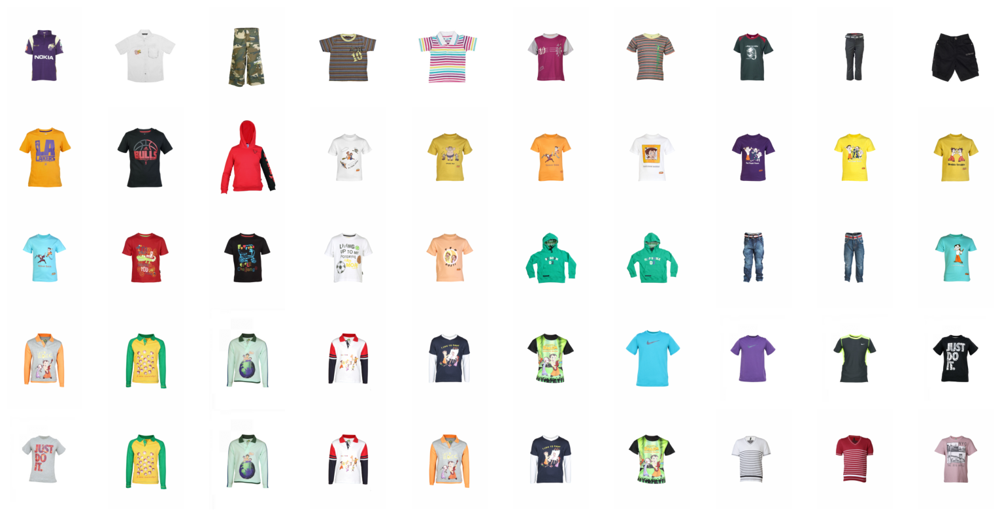

In [6]:
fig, axes = plt.subplots(5, 10, figsize=(20, 10))
for ax, image_path in zip(axes.flatten(), image_paths):
    image_np = plt.imread(image_path)
    image_np = resize(image_np, (400, 300))
    ax.imshow(image_np)
    ax.axis('off')
plt.subplots_adjust(wspace=0, hspace=0)

In [7]:
nq = 5# number of queries
ndb = 100  # number of samples in the database

selected_image_paths = random.sample(image_paths, ndb + nq)
db_image_paths = selected_image_paths[:ndb]
q_image_paths = selected_image_paths[-nq:]
q_image_paths[:5] 

[WindowsPath('C:/Users/hp/Downloads/data/Footwear/Women/Images/images_with_product_ids/32846.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Footwear/Men/Images/images_with_product_ids/57531.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Girls/Images/images_with_product_ids/43042.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Footwear/Men/Images/images_with_product_ids/34860.jpg'),
 WindowsPath('C:/Users/hp/Downloads/data/Apparel/Boys/Images/images_with_product_ids/41987.jpg')]

In [8]:
model = hub.KerasLayer("https://tfhub.dev/google/experts/bit/r50x1/in21k/consumer_goods/1")

In [9]:
def load_image(path):
    image_data = tf.io.read_file(path)
    image = tf.image.decode_image(image_data, channels=3, expand_animations=False)
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)
    return image

def resize_images(images):
    return tf.image.resize(images, (512, 512), preserve_aspect_ratio=True)

def l2_normalize(feature_vector):
    return tf.math.l2_normalize(feature_vector, axis=1)

def extract_features(image_paths, model):
    db = list(map(str, image_paths))
    db = tf.data.Dataset.from_tensor_slices(db)
    db = db.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    db = db.map(resize_images, num_parallel_calls=tf.data.AUTOTUNE)
    db = db.prefetch(5)

    features = db.map(model)
    features = features.map(l2_normalize)

    total = len(features)
    features = features.as_numpy_iterator() 
    features = tqdm(features, total=total)  
    features = list(features)
    features = np.concatenate(features)
    return features

In [ ]:
db_features_model = extract_features(db_image_paths, model)

  0%|          | 0/100 [00:00<?, ?it/s]

In [11]:
np.save("features.npy", db_features_model)

In [16]:
np.save("paths.npy", db_image_paths)

In [12]:
queries_features_model = extract_features(q_image_paths, model)

  0%|          | 0/5 [00:00<?, ?it/s]

In [13]:
queries_features_model.shape, db_features_model.shape

((5, 2048), (100, 2048))

In [14]:
scores = queries_features_model.dot(db_features_model.T)
scores.shape

(5, 100)

In [17]:
nq, ndb = scores.shape
#finding indexes of the k-elements with highest similarity to each query

k = 5
sorted_scores = scores.argsort(axis=1)[:, ::-1]  # sort descending per row
topk = sorted_scores[:, :k]  # get **indices** of the topk images for each row

topk_scores = np.stack([scores[i, topk[i]] for i in range(nq)])  # get topk scores (comprehensible version)
topk_scores

array([[0.87149763, 0.8403525 , 0.8394314 , 0.83464605, 0.83133614],
       [0.9312326 , 0.9057845 , 0.88682604, 0.8802915 , 0.8595732 ],
       [0.9049189 , 0.89043665, 0.8724916 , 0.86313635, 0.85783184],
       [0.9423617 , 0.93271667, 0.91921514, 0.9150895 , 0.9123249 ],
       [0.89371294, 0.88806176, 0.8724389 , 0.86964554, 0.8657695 ]],
      dtype=float32)

In [18]:
def unpad_image(image_np):
    # remove some whitespace around the images
    image_np = np.stack([image_np, image_np, image_np], axis=-1) if image_np.ndim < 3 else image_np
    rr, cc = np.nonzero((image_np != 255).any(axis=2))
    y0, y1 = rr.min(), rr.max()
    x0, x1 = cc.min(), cc.max()
    return image_np[y0:y1+1, x0:x1+1]

def show_images(paths, figsize=None):
    n_images = len(paths)
    fig, axes = plt.subplots(1, n_images, figsize=figsize)
    for ax, path in zip(axes, paths):
        image_np = plt.imread(path)
        image_np = unpad_image(image_np)
        image_np = resize(image_np, (363, 266))
        ax.imshow(image_np)
        ax.set_xticks([])
        ax.set_yticks([])

    return fig

First line are the queries 



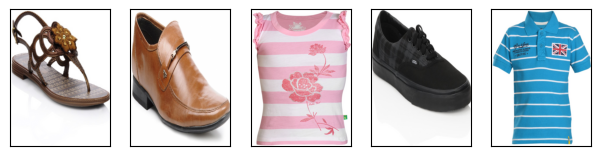

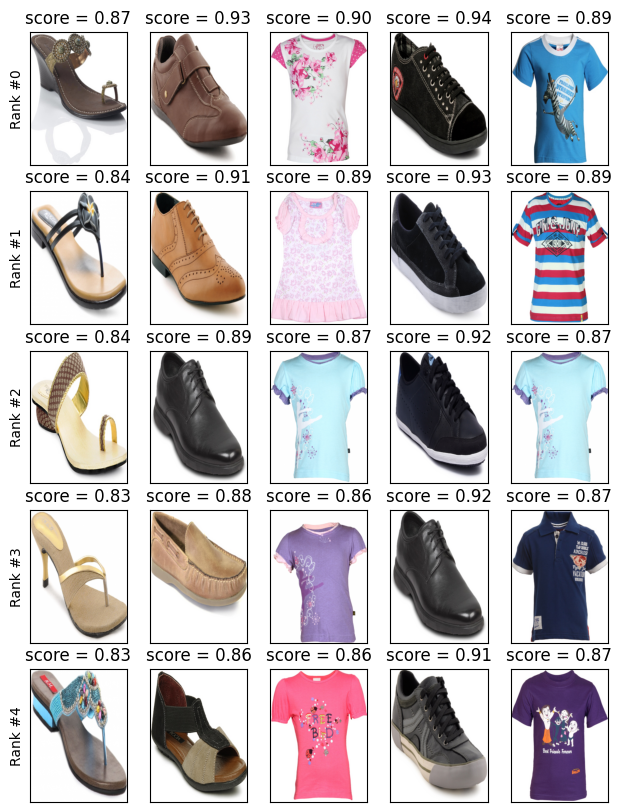

In [19]:
print("First line are the queries \n")
# show queries
fig = show_images(q_image_paths, figsize=(1.5*nq, 20))

# show topk similar 
fig, axes = plt.subplots(k, nq, figsize=(fig.get_figwidth(), 2*k))
for j in range(k):
    axes[j, 0].set_ylabel(f'Rank #{j}')
    for i in range(nq):
        image_np = plt.imread(db_image_paths[topk[i, j]])
        image_np = unpad_image(image_np)
        image_np = resize(image_np, (363, 266))
        axes[j, i].imshow(image_np)
        axes[j, i].set_title('score = {:.2f}'.format(topk_scores[i, j]))
        axes[j, i].set_xticks([])
        axes[j, i].set_yticks([])

In [ ]:
db_image_ids = [int(p.stem) for p in db_image_paths]
q_image_ids = [int(p.stem) for p in q_image_paths]

db_labels = fashion_df.loc[db_image_ids].Category
q_labels = fashion_df.loc[q_image_ids].Category

In [ ]:
groundtruth = np.empty((nq, ndb), dtype=bool)
for i, qi_label in enumerate(q_labels):
    for j, dbj_label in enumerate(db_labels):
        groundtruth[i, j] = (qi_label == dbj_label)
groundtruth

array([[False,  True,  True, ...,  True, False,  True],
       [False,  True,  True, ...,  True, False,  True],
       [ True, False, False, ..., False,  True, False],
       ...,
       [ True, False, False, ..., False,  True, False],
       [ True, False, False, ..., False,  True, False],
       [ True, False, False, ..., False,  True, False]])

In [ ]:
def compute_mean_ap(groundtruth, scores):
    aps = []
    for groundtruth_i, scores_i in zip(groundtruth, scores):
        ap = average_precision_score(groundtruth_i, scores_i)
        aps.append(ap)

    return np.mean(aps)

In [ ]:
compute_mean_ap(groundtruth, scores)

np.float64(0.9761843922829189)

In [ ]:
n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit_predict(db_features_model)  # run kmeans on the db features to find centroids
#kmeans.cluster_centers_  # uncomment to see the cluster centroids

array([ 2, 14, 15, 17,  8, 10, 16,  7,  3, 18,  4, 16, 17,  3,  4,  2,  6,
       10, 17,  2, 14, 10,  2,  2,  4, 13, 12,  7,  1,  1, 14, 18,  7, 18,
       15, 10, 12, 16,  9,  7, 14, 17, 15, 10,  4, 18,  3, 18,  6,  1, 14,
        9,  3, 16, 19, 10,  4,  1,  5, 18,  7, 17,  4,  2,  6,  4, 16, 10,
        2,  2, 18, 17,  8,  6,  9,  6, 18,  9,  5, 18, 19, 18,  5, 18,  5,
        5, 17,  3,  2, 16, 14, 19,  2,  4, 16, 16, 16,  4, 18,  9,  4,  5,
        7,  5,  6,  6,  9, 16,  6,  7, 12, 11, 13,  5, 19,  8,  3,  2,  6,
        3,  3,  4, 10,  6, 10,  8, 16, 18,  7,  3, 14,  8,  4,  4, 10,  7,
        3,  8,  7, 15, 10, 10,  2,  4, 14, 18, 16,  4, 17, 18,  7,  5,  3,
        3,  5,  4, 19,  4, 10,  7, 11, 17,  7,  9,  3,  3, 10,  5,  7, 15,
        4,  6, 10,  3,  4, 18,  9,  9,  4,  6,  8,  2,  5, 11, 18,  4, 18,
        1, 10,  5, 12, 18, 15, 11, 17,  9, 18,  4,  8,  5, 11,  4,  4,  5,
        3,  6, 10, 18,  0, 17, 16, 10, 10,  1,  4, 13,  9, 14, 10,  9,  2,
        2,  7, 12,  3, 14

In [ ]:
labels = kmeans.predict(db_features_model)  # assign each feature to the nearest cluster and return the cluster index

# let's see how images are distributed among clusters
counts = Counter(labels).most_common()  
for cluster_idx, n_images in counts:
    print(f'Cluster #{cluster_idx}: {n_images} samples')

Cluster #4: 59 samples
Cluster #18: 41 samples
Cluster #10: 37 samples
Cluster #5: 34 samples
Cluster #7: 31 samples
Cluster #16: 30 samples
Cluster #17: 29 samples
Cluster #6: 29 samples
Cluster #3: 27 samples
Cluster #2: 26 samples
Cluster #14: 22 samples
Cluster #9: 21 samples
Cluster #8: 18 samples
Cluster #12: 18 samples
Cluster #11: 16 samples
Cluster #0: 16 samples
Cluster #15: 13 samples
Cluster #1: 13 samples
Cluster #19: 12 samples
Cluster #13: 8 samples


In [ ]:
distances_to_centroids = kmeans.transform(db_features_model)  # .transform() computes the distances between features and all centroids
representatives = distances_to_centroids.argmin(axis=0)  # for each centroid, we find the index of the sample with the smallest distance, that's the representative one.

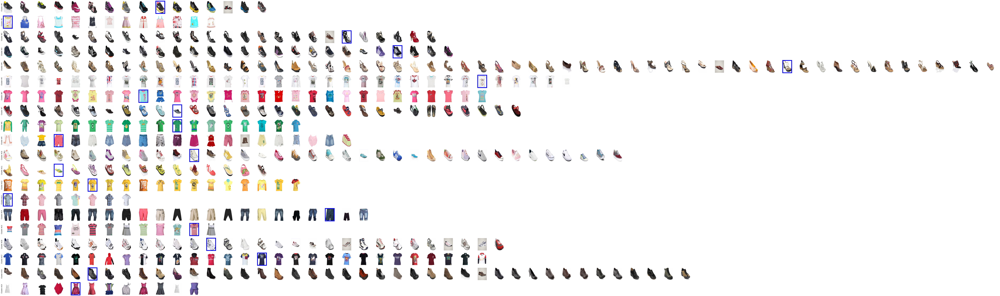

In [ ]:
maxsize = counts[0][1]  # size of the biggest cluster
fig, axes = plt.subplots(n_clusters, maxsize, figsize=(2*maxsize, 1.75*n_clusters))

# hide ticks and spines
for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
    plt.setp(ax.spines.values(), visible=False)

# we create cluster groups by sorting and grouping by cluster labels
labels_and_idx = [(l, i) for i, l in enumerate(labels)]
labels_and_idx = sorted(labels_and_idx)
cluster_groups = itertools.groupby(labels_and_idx, key=lambda x: x[0])

# for each group, we plot the belonging images in a row
for cluster_idx, cluster in cluster_groups:
    axes[cluster_idx, 0].set_ylabel(f'Cluster #{cluster_idx}')
  
    for i, (_, sample_idx) in enumerate(cluster):
        image_np = plt.imread(db_image_paths[sample_idx])
        image_np = unpad_image(image_np)
        image_np = resize(image_np, (182, 133))
        axes[cluster_idx, i].imshow(image_np)

    # highlight the representative sample of the cluster
        if sample_idx in representatives:  
            plt.setp(axes[cluster_idx, i].spines.values(), edgecolor='blue', linewidth=5, visible=True)

plt.subplots_adjust(wspace=0)

In [ ]:
classifier = SVC()
classifier.fit(db_features_model, db_labels)

SVC()

In [ ]:
q_predictions = classifier.predict(queries_features_model)
q_predictions

array(['Apparel', 'Apparel', 'Footwear', 'Footwear', 'Apparel', 'Apparel',
       'Footwear', 'Apparel', 'Footwear', 'Apparel', 'Footwear',
       'Apparel', 'Apparel', 'Footwear', 'Apparel', 'Footwear',
       'Footwear', 'Footwear', 'Apparel', 'Footwear', 'Apparel',
       'Footwear', 'Footwear', 'Footwear', 'Footwear'], dtype=object)

In [ ]:
q_labels == q_predictions

ProductId
48256    True
37622    True
35657    True
59147    True
37613    True
33139    True
53130    True
54932    True
9116     True
30729    True
29576    True
52125    True
38502    True
13992    True
38987    True
10110    True
5654     True
26553    True
41991    True
30261    True
33254    True
45322    True
15521    True
54117    True
57475    True
Name: Category, dtype: bool